# Single Cell RNA-Seq Velocity analysis using the loom files generated by kallisto Bustools

# Before, the cell IDs were changed in each loom file to match those in the seurat object from Anxo

# Specifically, in the first loom file (from MAD1), I added "-1" to all cell IDs and so on with the other loom files 

In [1]:
import loompy

In [2]:
 import h5py 

In [4]:
# Load the loom files
files = ["/Users/mohamedomar/Desktop/Looms/MAD1.loom", "/Users/mohamedomar/Desktop/Looms/MAD2.loom", "/Users/mohamedomar/Desktop/Looms/MAD3.loom", "/Users/mohamedomar/Desktop/Looms/MAD4.loom", "/Users/mohamedomar/Desktop/Looms/MAD5.loom", "/Users/mohamedomar/Desktop/Looms/MAD6.loom"]

In [309]:
#df = loompy.connect('/Users/mohamedomar/Desktop/Looms/MAD3.loom', validate=False)

In [3]:
#loompy.__version__

'3.0.6'

In [19]:
#df

,,obs_names,AAACCCAAGAAACCCA,AAACCCAAGAAACTGT,AAACCCAAGAAGTCAT,AAACCCAAGACAACAT,AAACCCAAGACATAAC,AAACCCAAGACCATAA,AAACCCAAGACCATGG,AAACCCAAGACCATTC,AAACCCAAGACGACGT,AAACCCAAGACGCATG,...
gene_name,var_names,,,,,,,,,,,,...
Ifi202b,ENSMUSG00000026535.9,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...
Serpinb8,ENSMUSG00000026315.13,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...
Fasl,ENSMUSG00000000817.10,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...
Aox1,ENSMUSG00000063558.4,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...
Cnnm3,ENSMUSG00000001138.13,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...
Lman2l,ENSMUSG00000001143.13,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...
Ankrd39,ENSMUSG00000079610.9,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...
Usf1,ENSMUSG00000026641.13,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...
Rrp15,ENSMUSG00000001305.5,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...


In [25]:
#df.ra.keys()

['gene_name', 'var_names']

In [5]:
# Combine the loom files into a single one based on var_names (ensembel gene IDs)
loompy.combine(files, "Loom_Combined.loom", key = "var_names")

In [27]:
#df = loompy.connect('/Users/mohamedomar/Desktop/Loom_Combined.loom')

In [28]:
#df

,,obs_names,AAACCCAAGAAACCCA,AAACCCAAGAAAGTCT,AAACCCAAGAACAAGG,AAACCCAAGAAGCCTG,AAACCCAAGAAGCGCT,AAACCCAAGAAGCTGC,AAACCCAAGACAACAT,AAACCCAAGACAAGCC,AAACCCAAGACCAAGC,AAACCCAAGACCATGG,...
gene_name,var_names,,,,,,,,,,,,...
Ifi202b,ENSMUSG00000026535.9,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...
Serpinb8,ENSMUSG00000026315.13,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...
Fasl,ENSMUSG00000000817.10,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...
Aox1,ENSMUSG00000063558.4,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...
Cnnm3,ENSMUSG00000001138.13,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...
Lman2l,ENSMUSG00000001143.13,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...
Ankrd39,ENSMUSG00000079610.9,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...
Usf1,ENSMUSG00000026641.13,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...
Rrp15,ENSMUSG00000001305.5,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...


In [30]:
#df.layers.keys()

['', 'spliced', 'unspliced']

In [3]:
import anndata

In [4]:
import scvelo as scv

In [5]:
import pandas as pd

In [6]:
import numpy as np

In [7]:
import matplotlib as plt

In [8]:
%load_ext rpy2.ipython

In [9]:
# Load the combined loom file to play with
#BigLoom = anndata.read_loom('/Users/mohamedomar/Desktop/Loom_Combined.loom') # Read the loom file

KeyboardInterrupt: 

In [127]:
#BigLoom  # Look at the loom file

AnnData object with n_obs × n_vars = 1516020 × 55421
    var: 'gene_name'
    layers: 'matrix', 'spliced', 'unspliced'

In [9]:
# Load the cell IDs from the epithelial seurat object
cellID_obs = pd.read_csv("/Users/mohamedomar/Desktop/cellID_obs.csv") # Read the cell IDs from the seurat object metadata

In [10]:
# Read the umap coordinates from the seurat object metadata
umap_cord = pd.read_csv("/Users/mohamedomar/Desktop/cell_embeddings.csv") 

In [11]:
# Read the clusters information from the seurat object metadata
cell_clusters = pd.read_csv("/Users/mohamedomar/Desktop/clusters.csv") 

In [128]:
# Look at the column names in the loom file (Cell IDs)
#BigLoom.obs_names 

Index(['AAACCCAAGAAACCCA-1', 'AAACCCAAGAAAGTCT-1', 'AAACCCAAGAACAAGG-1',
       'AAACCCAAGAAGCCTG-1', 'AAACCCAAGAAGCGCT-1', 'AAACCCAAGAAGCTGC-1',
       'AAACCCAAGACAACAT-1', 'AAACCCAAGACAAGCC-1', 'AAACCCAAGACCAAGC-1',
       'AAACCCAAGACCATGG-1',
       ...
       'TTTGTTGTCTGGCCTT-6', 'TTTGTTGTCTGGGCGT-6', 'TTTGTTGTCTTACACT-6',
       'TTTGTTGTCTTCTGTA-6', 'TTTGTTGTCTTGGAAC-6', 'TTTGTTGTCTTGGGCG-6',
       'TTTGTTGTCTTGGTCC-6', 'TTTGTTGTCTTGTTAC-6', 'TTTGTTGTCTTTCCAA-6',
       'TTTGTTGTCTTTCTAG-6'],
      dtype='object', length=1516020)

In [129]:
#BigLoom2 = BigLoom[np.isin(BigLoom.obs.index,cellID_obs["x"])] ## Filter the cells to keep only those in the seurat object 

In [130]:
#BigLoom2 # Look at the filtered loom 

View of AnnData object with n_obs × n_vars = 24823 × 55421
    var: 'gene_name'
    layers: 'matrix', 'spliced', 'unspliced'

In [21]:
#BigLoom2.write_loom("BigLoomFiltered.loom") # Save the newly created filtered loom

In [12]:
BigLoom = anndata.read_loom('/Users/mohamedomar/Desktop/BigLoomFiltered.loom') # Read the filtered loom file

In [13]:
BigLoom3 = BigLoom

In [14]:
BigLoom3

AnnData object with n_obs × n_vars = 24823 × 55421
    var: 'gene_name'
    layers: 'matrix', 'spliced', 'unspliced'

In [24]:
BigLoom3_index = pd.DataFrame(BigLoom3.obs.index)  ## Change the name of the columns in loom and umap to Cell ID

In [25]:
BigLoom3_index = BigLoom3_index.rename(columns = {0:'Cell ID'})

In [26]:
umap_cord = umap_cord.rename(columns = {'Unnamed: 0':'Cell ID'})

In [27]:
umap_ordered = BigLoom3_index.merge(umap_cord, on = "Cell ID") 

In [28]:
BigLoom3_index

,Cell ID
0,AAACCCAAGTAAAGCT-1
1,AAACCCAAGTAGCCAG-1
2,AAACCCAGTTCAGGTT-1
3,AAACCCATCGTGGGTC-1
4,AAACGCTAGAAGGCTC-1
...,...
24818,TTTGGAGTCTCGAGTA-6
24819,TTTGGTTCATAACAGA-6
24820,TTTGTTGAGGGAGATA-6
24821,TTTGTTGAGTCTCTGA-6


In [29]:
umap_ordered

,Cell ID,UMAP_1,UMAP_2
0,AAACCCAAGTAAAGCT-1,-11.830894,-0.377738
1,AAACCCAAGTAGCCAG-1,-13.040355,0.457261
2,AAACCCAGTTCAGGTT-1,-13.328900,-3.429485
3,AAACCCATCGTGGGTC-1,12.814798,-2.501589
4,AAACGCTAGAAGGCTC-1,-12.065064,-0.321110
...,...,...,...
24818,TTTGGAGTCTCGAGTA-6,4.920557,4.879825
24819,TTTGGTTCATAACAGA-6,2.818790,3.596527
24820,TTTGTTGAGGGAGATA-6,8.235288,5.151428
24821,TTTGTTGAGTCTCTGA-6,-6.618692,4.432536


In [30]:
umap_ordered = umap_ordered.iloc[:,1:]


In [31]:
umap_ordered

,UMAP_1,UMAP_2
0,-11.830894,-0.377738
1,-13.040355,0.457261
2,-13.328900,-3.429485
3,12.814798,-2.501589
4,-12.065064,-0.321110
...,...,...
24818,4.920557,4.879825
24819,2.818790,3.596527
24820,8.235288,5.151428
24821,-6.618692,4.432536


In [32]:
BigLoom3.obsm['X_umap'] = umap_ordered.values ## Add the umpa coordinate info to the loom file

In [33]:
umap_ordered.values

array([[-11.83089351,  -0.37773771],
       [-13.04035472,   0.45726115],
       [-13.32890033,  -3.42948545],
       ...,
       [  8.23528815,   5.15142762],
       [ -6.61869239,   4.43253647],
       [  7.34133387,   5.16873347]])

In [34]:
BigLoom3

AnnData object with n_obs × n_vars = 24823 × 55421
    var: 'gene_name'
    obsm: 'X_umap'
    layers: 'matrix', 'spliced', 'unspliced'

In [35]:
#cell_clusters = pd.read_csv("clusters.csv") # Read the cell cluster info from the seurat object metadata / Repeated

FileNotFoundError: [Errno 2] No such file or directory: 'clusters.csv'

In [36]:
cell_clusters

,Seurat_Intestine.seurat_clusters,CellID
0,7,AAACCCAAGTAAAGCT-1
1,7,AAACCCAAGTAGCCAG-1
2,7,AAACCCAGTTCAGGTT-1
3,11,AAACCCATCGTGGGTC-1
4,7,AAACGCTAGAAGGCTC-1
...,...,...
24818,1,TTTGGAGTCTCGAGTA-6
24819,0,TTTGGTTCATAACAGA-6
24820,1,TTTGTTGAGGGAGATA-6
24821,3,TTTGTTGAGTCTCTGA-6


In [37]:
cell_clusters = cell_clusters.rename(columns = {'CellID':'Cell ID'}) ## Do the same as UMAP

In [38]:
cell_clusters = cell_clusters.rename(columns = {'IntestineSeurat.sample.cell_type':'Cluster'}) 

In [39]:
cell_clusters

,Seurat_Intestine.seurat_clusters,Cell ID
0,7,AAACCCAAGTAAAGCT-1
1,7,AAACCCAAGTAGCCAG-1
2,7,AAACCCAGTTCAGGTT-1
3,11,AAACCCATCGTGGGTC-1
4,7,AAACGCTAGAAGGCTC-1
...,...,...
24818,1,TTTGGAGTCTCGAGTA-6
24819,0,TTTGGTTCATAACAGA-6
24820,1,TTTGTTGAGGGAGATA-6
24821,3,TTTGTTGAGTCTCTGA-6


In [40]:
cell_clusters_ordered = BigLoom3_index.merge(cell_clusters, on = "Cell ID")

In [41]:
cell_clusters_ordered

,Cell ID,Seurat_Intestine.seurat_clusters
0,AAACCCAAGTAAAGCT-1,7
1,AAACCCAAGTAGCCAG-1,7
2,AAACCCAGTTCAGGTT-1,7
3,AAACCCATCGTGGGTC-1,11
4,AAACGCTAGAAGGCTC-1,7
...,...,...
24818,TTTGGAGTCTCGAGTA-6,1
24819,TTTGGTTCATAACAGA-6,0
24820,TTTGTTGAGGGAGATA-6,1
24821,TTTGTTGAGTCTCTGA-6,3


In [42]:
cell_clusters_ordered = cell_clusters_ordered.iloc[:,1:]

In [43]:
cell_clusters_ordered

,Seurat_Intestine.seurat_clusters
0,7
1,7
2,7
3,11
4,7
...,...
24818,1
24819,0
24820,1
24821,3


In [44]:
BigLoom3.uns['X_Clusters'] = cell_clusters_ordered.values # Add the cluster info to the loom file ???? NOT working

In [45]:
BigLoom3.uns

OverloadedDict, wrapping:
	OrderedDict([('X_Clusters', array([[7],
       [7],
       [7],
       ...,
       [1],
       [3],
       [1]]))])
With overloaded keys:
	['neighbors'].

In [46]:
BigLoom3.obs["clusters"] = cell_clusters_ordered.values # Add Cluster info to BigLoom.obs

In [47]:
color = BigLoom3.uns['X_Clusters']  ## ???? Not working

In [48]:
color

array([[7],
       [7],
       [7],
       ...,
       [1],
       [3],
       [1]])

In [49]:
scv.pp.filter_and_normalize(BigLoom3, min_shared_counts=1, n_top_genes=2000)  ## Filter and normalize

Filtered out 42157 genes that are detected 1 counts (shared).
Normalized count data: X, spliced, unspliced.
Exctracted 2000 highly variable genes.
Logarithmized X.


In [50]:
BigLoom3

AnnData object with n_obs × n_vars = 24823 × 2000
    obs: 'clusters', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'gene_name', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'X_Clusters'
    obsm: 'X_umap'
    layers: 'matrix', 'spliced', 'unspliced'

In [51]:
scv.pp.moments(BigLoom3, n_pcs=30, n_neighbors=30)  ## Compute moments

computing neighbors
    finished (0:00:14) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [52]:
scv.tl.velocity(BigLoom3, mode = "stochastic") # Compute velocity

computing velocities
    finished (0:00:06) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [54]:
scv.tl.velocity_graph(BigLoom3) 

computing velocity graph
    finished (0:01:47) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:05) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_clusters.png


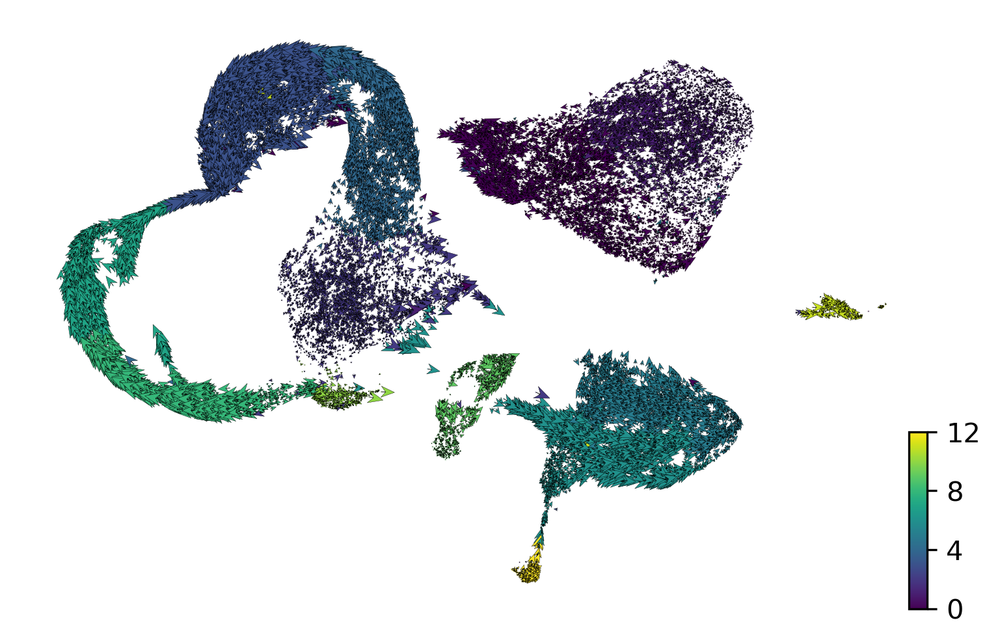

In [55]:
scv.pl.velocity_embedding(BigLoom3, basis = 'umap', color = color, arrow_length=10, arrow_size=10, save = "clusters.png", dpi = 300)

saving figure to file ./figures/scvelo_Velocity.png


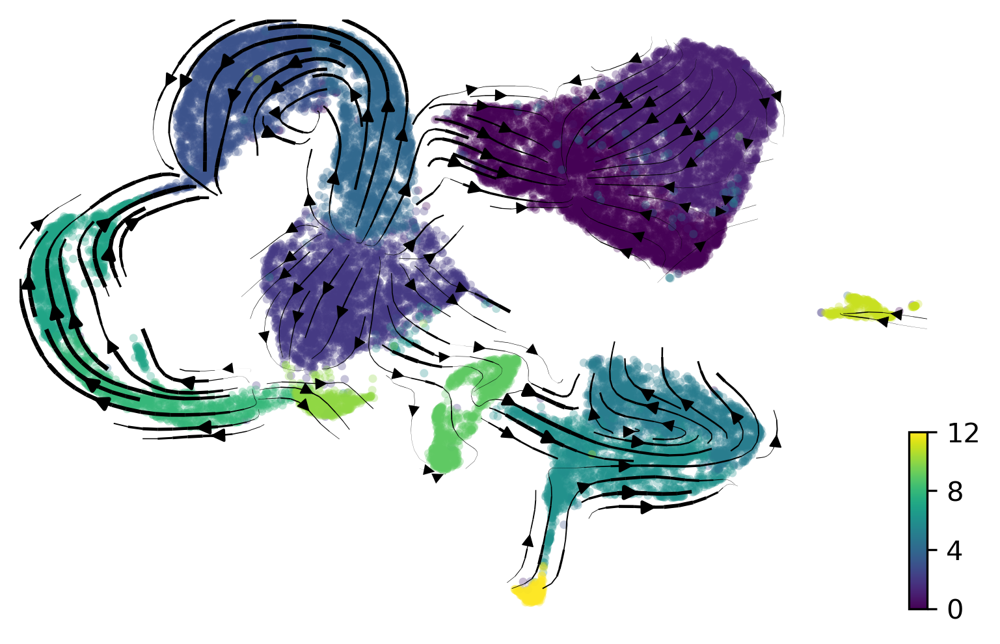

In [56]:
scv.pl.velocity_embedding_stream(BigLoom3, basis='umap', save = "Velocity.png", color = color, dpi=300) #Stream plot of velocities on the embedding.


In [57]:
BigLoom3

AnnData object with n_obs × n_vars = 24823 × 2000
    obs: 'clusters', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'gene_name', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_r2', 'velocity_genes'
    uns: 'X_Clusters', 'pca', 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_umap', 'X_pca', 'velocity_umap'
    varm: 'PCs'
    layers: 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'distances', 'connectivities'

In [58]:
BigLoom3.var_names = BigLoom3.var['gene_name']  # Change the row names to gene symbols

In [59]:
BigLoom3.var

,gene_name,gene_count_corr,means,dispersions,dispersions_norm,highly_variable,velocity_gamma,velocity_r2,velocity_genes
gene_name,,,,,,,,,
Cacna1e,Cacna1e,-0.0155,0.000429,1.295484,1.762711,True,0.112956,-0.058418,False
Cryba2,Cryba2,-0.0681,0.050803,1.608022,2.576794,True,0.007403,0.215648,True
Prox1,Prox1,-0.0692,0.023592,1.188871,1.485010,True,0.152293,0.559689,True
Slamf1,Slamf1,-0.0266,0.001886,1.160401,1.410853,True,0.097763,-0.006905,False
Cd48,Cd48,-0.0370,0.008965,0.931831,0.815487,True,0.067787,-0.005283,False
...,...,...,...,...,...,...,...,...,...
4933407K13Rik,4933407K13Rik,-0.0119,0.002117,0.963583,0.898193,True,0.546710,-0.675652,False
Gm14634,Gm14634,-0.0123,0.002297,0.944506,0.848503,True,0.370555,-0.536008,False
Gm15232,Gm15232,-0.0209,0.001309,1.016910,1.037096,True,0.131856,-0.013628,False


saving figure to file ./figures/scvelo_PhasePortrait.png


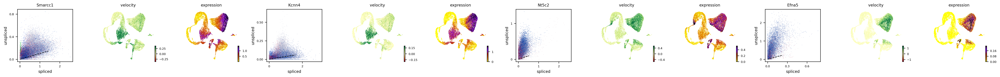

In [61]:
scv.pl.velocity(BigLoom3, ['Smarcc1',  'Kcnn4', 'Nt5c2', "Efna5"], ncols=6, dpi = 300, save = "PhasePortrait.png") ##phase portraits of some marker genes


## Identify important genes

In [62]:
scv.tl.rank_velocity_genes(BigLoom3, groupby='clusters', min_corr=.3) #runs a differential velocity t-test and outpus a gene ranking for each cluster

ranking velocity genes
    finished (0:00:08) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


In [63]:
df = scv.DataFrame(BigLoom3.uns['rank_velocity_genes']['names'])

In [64]:
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,Nt5c2,Efna5,Smarcc1,Eps8l3,Enpep,Kcnma1,Kcnma1,Anpep,Efna1,Rims2,Cttnbp2,St18,5330417C22Rik
1,Efna5,Nt5c2,Kcnn4,Emp1,Naaladl1,Adamts17,Zdhhc14,Slc43a2,Ddc,Phldb2,Zfhx3,Zfhx3,Ghr
2,Slc10a2,Shf,Uhrf1,Rab30,Sis,Cd200,Sidt1,Cidec,Anpep,Ptprn2,Tmem131l,Txndc16,9030622O22Rik
3,Egfr,Asz1,Txndc16,Adh6a,Muc3,Dpysl3,Glt1d1,Aspa,Papss2,Ncam2,Smarcc1,Trpm5,Ramp1
4,Rims2,Lama5,Tmem131l,Noct,Mep1b,9030622O22Rik,Gm609,Slc5a1,Enpep,Cadps,Soat1,Itpr2,Spdef


In [65]:
kwargs = dict(frameon=False, size=10, linewidth=1.5,
              add_outline='2, 1, 0')

saving figure to file ./figures/scvelo_StemScatter.png


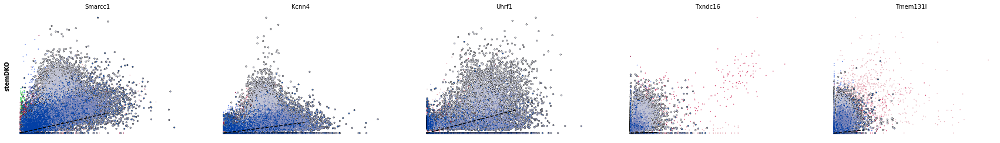

saving figure to file ./figures/scvelo_Tumor1Scatter.png


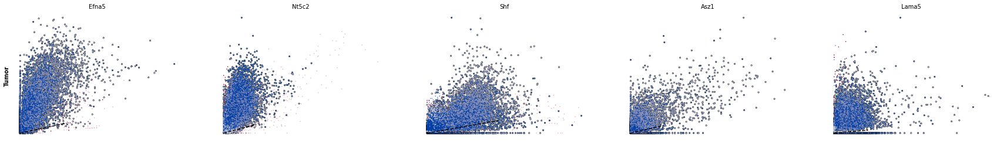

saving figure to file ./figures/scvelo_Tumor0Scatter.png


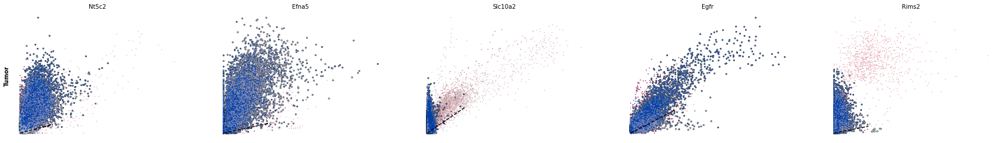

In [74]:
scv.pl.scatter(BigLoom3, df['2'][:5], ylabel='stemDKO', **kwargs, save = "StemScatter.png")
scv.pl.scatter(BigLoom3, df['1'][:5], ylabel='Tumor', **kwargs, save = "Tumor1Scatter.png")
scv.pl.scatter(BigLoom3, df['0'][:5], ylabel='Tumor', **kwargs, save = "Tumor0Scatter.png")

In [75]:
scv.tl.score_genes_cell_cycle(BigLoom3) ##cell cycle scores (standardized scores of mean expression levels of phase marker genes).


calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


saving figure to file ./figures/scvelo_CellCycle.png


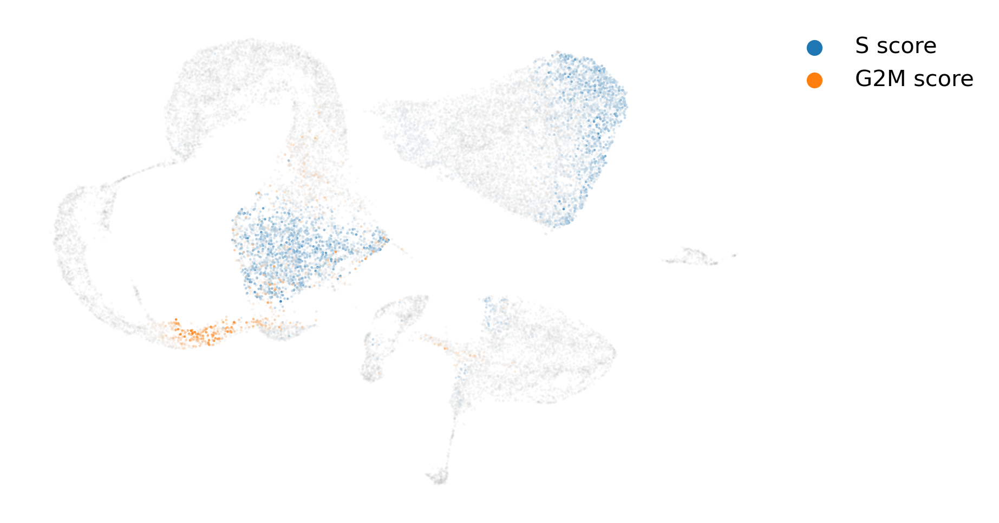

In [77]:
scv.pl.scatter(BigLoom3, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95], dpi = 300, save = "CellCycle.png")

In [78]:
s_genes, g2m_genes = scv.utils.get_phase_marker_genes(BigLoom3)

In [79]:
s_genes = scv.get_df(BigLoom3[:, s_genes], 'spearmans_score', sort_values=True).index

In [80]:
g2m_genes = scv.get_df(BigLoom3[:, g2m_genes], 'spearmans_score', sort_values=True).index

In [81]:
s_genes

Index(['Uhrf1', 'Rrm2'], dtype='object', name='gene_name')

In [82]:
g2m_genes

Index(['Top2a', 'Cenpe', 'Cdk1', 'Mki67', 'Nusap1', 'Cdc20', 'Birc5', 'Cenpa'], dtype='object', name='gene_name')

In [83]:
kwargs = dict(frameon=False, ylabel='cell cycle genes')

saving figure to file ./figures/scvelo_CellPhasePortrait.png


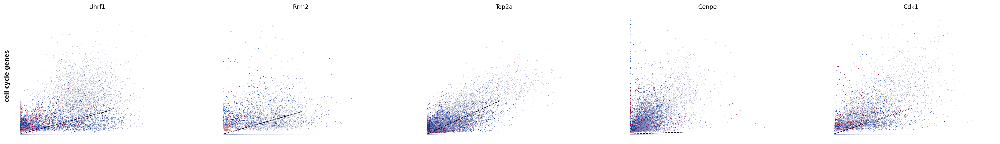

In [87]:
scv.pl.scatter(BigLoom3, list(s_genes[:2]) + list(g2m_genes[:3]), **kwargs, dpi = 200, save = "CellPhasePortrait.png")

saving figure to file ./figures/scvelo_CellPhasePortrait.png


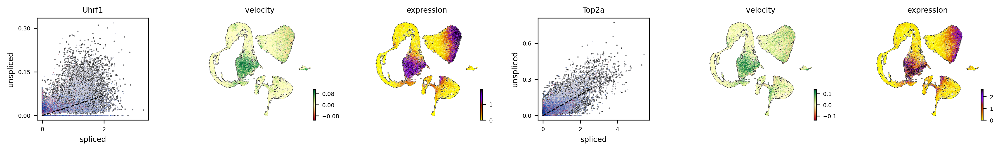

In [90]:
scv.pl.velocity(BigLoom3, ['Uhrf1', 'Top2a'], ncols=2, add_outline=True, dpi = 300, save = "CellPhasePortrait.png")

## Speed and coherence
# The speed or rate of differentiation is given by the length of the velocity vector
# The coherence of the vector field (i.e., how a velocity vector correlates with its neighboring velocities) provides a measure of confidence.

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
saving figure to file ./figures/scvelo_VelocityLengthAndConfidence.png


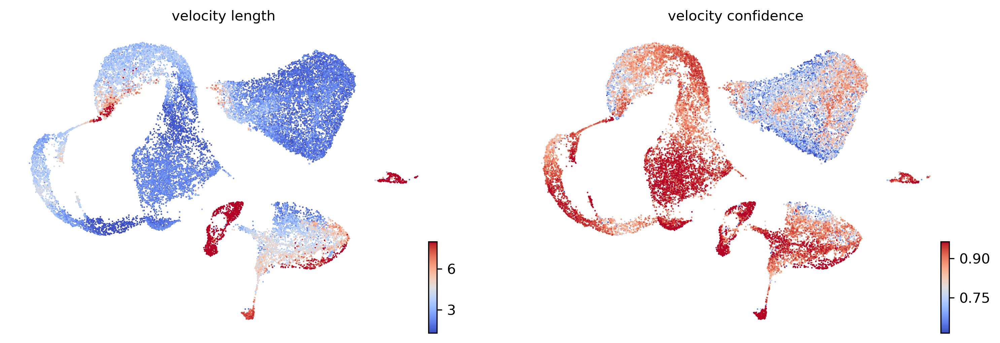

In [92]:
scv.tl.velocity_confidence(BigLoom3)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(BigLoom3, c=keys, cmap='coolwarm', perc=[5, 95], dpi = 300, save = "VelocityLengthAndConfidence.png")

In [93]:
df = BigLoom3.obs.groupby('clusters')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

clusters,0,1,2,3,4,5,6,7,8,9,10,11,12
velocity_length,2.226398,1.762188,2.022695,3.904158,2.221349,3.659283,4.694636,3.452942,2.037159,14.230660,1.883794,9.422916,7.077304
velocity_confidence,0.712996,0.746404,0.929414,0.810932,0.879507,0.816121,0.904660,0.890909,0.889679,0.921537,0.935079,0.910382,0.978292


## Velocity graph and pseudotime


saving figure to file ./figures/scvelo_VelocityGraph.png


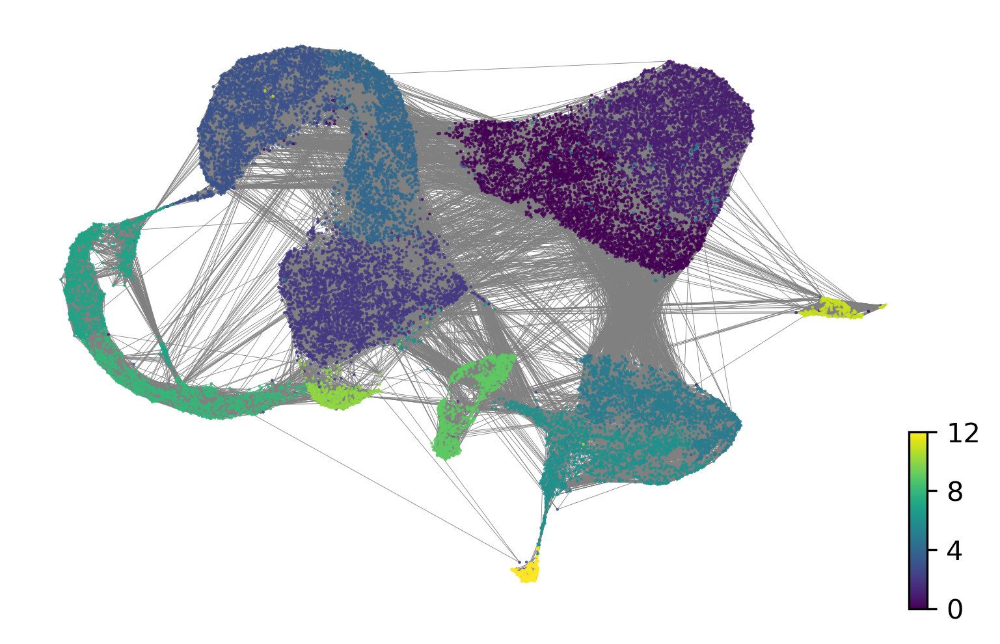

In [94]:
scv.pl.velocity_graph(BigLoom3, threshold=.1, color = color, dpi = 300, save = "VelocityGraph.png") # Velocity graph

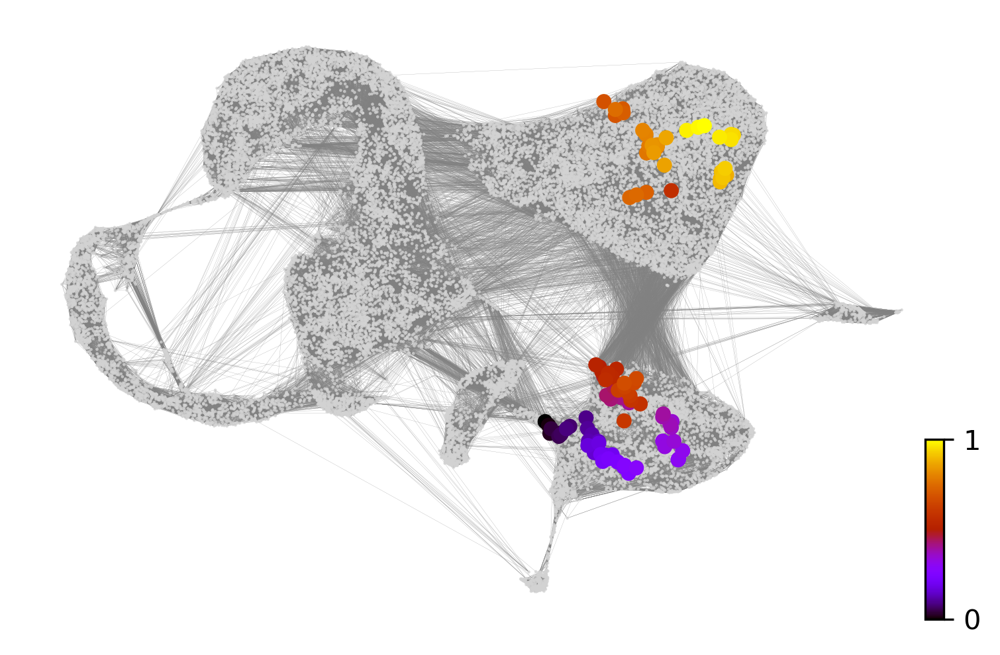

In [112]:
x, y = scv.utils.get_cell_transitions(BigLoom3, basis='umap', starting_cell= 1000) ## descendents/anscestors
ax = scv.pl.velocity_graph(BigLoom3, c='lightgrey', edge_width=.05, show=False, dpi = 300)
ax = scv.pl.scatter(BigLoom3, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax, dpi = 300)

In [96]:
scv.tl.velocity_pseudotime(BigLoom3) ## Pseudotime

computing terminal states
    identified 7 regions of root cells and 3 regions of end points .
    finished (0:00:04) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


saving figure to file ./figures/scvelo_VelocityPseudoTime.png


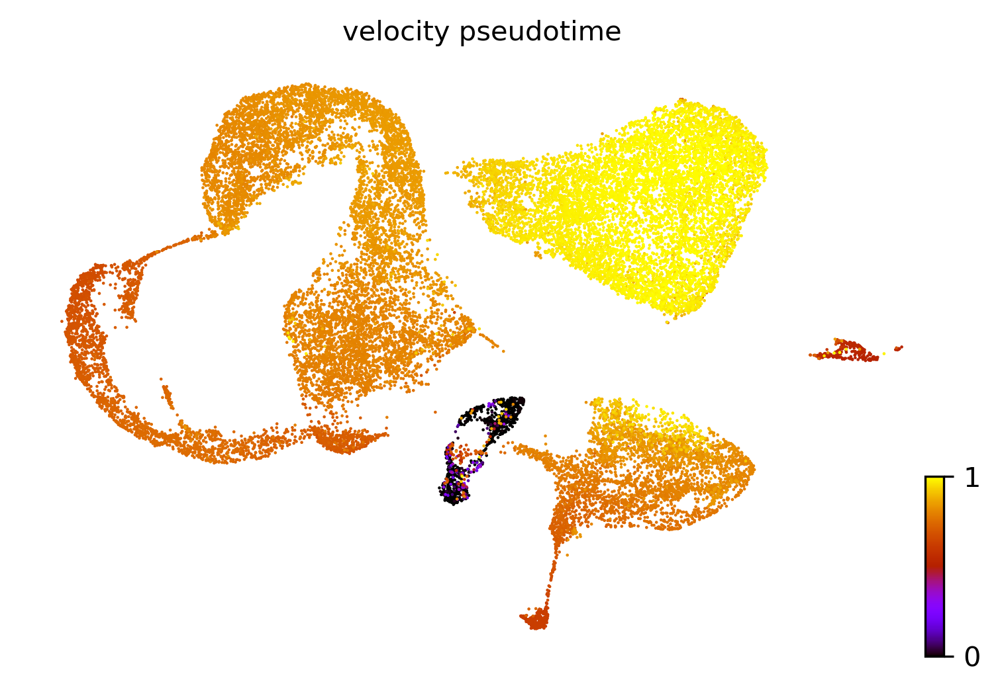

In [97]:
scv.pl.scatter(BigLoom3, color='velocity_pseudotime', cmap='gnuplot', dpi = 300, save = "VelocityPseudoTime.png")

### PAGA velocity graph

In [113]:
BigLoom3.uns['neighbors']['distances'] = BigLoom3.obsp['distances']

In [114]:
BigLoom3.uns['neighbors']['connectivities'] = BigLoom3.obsp['connectivities']

In [115]:
scv.tl.paga(BigLoom3, groups='clusters')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:05) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


In [116]:
df = scv.get_df(BigLoom3, 'paga/transitions_confidence', precision=2).T

In [117]:
df.style.background_gradient(cmap='Blues').format('{:.2g}')

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0,0.45,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0.042,0,0,0.1,0,0,0,0,0,0,0,0
3,0.042,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0.18,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0.16,0,0,0,0,0,0,0
7,0,0,0,0.021,0,0,0,0,0,0,0,0,0
8,0,0,0.018,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0.013,0,0,0,0,0,0,0,0,0


saving figure to file ./figures/scvelo_PAGAVelocityGraph.png


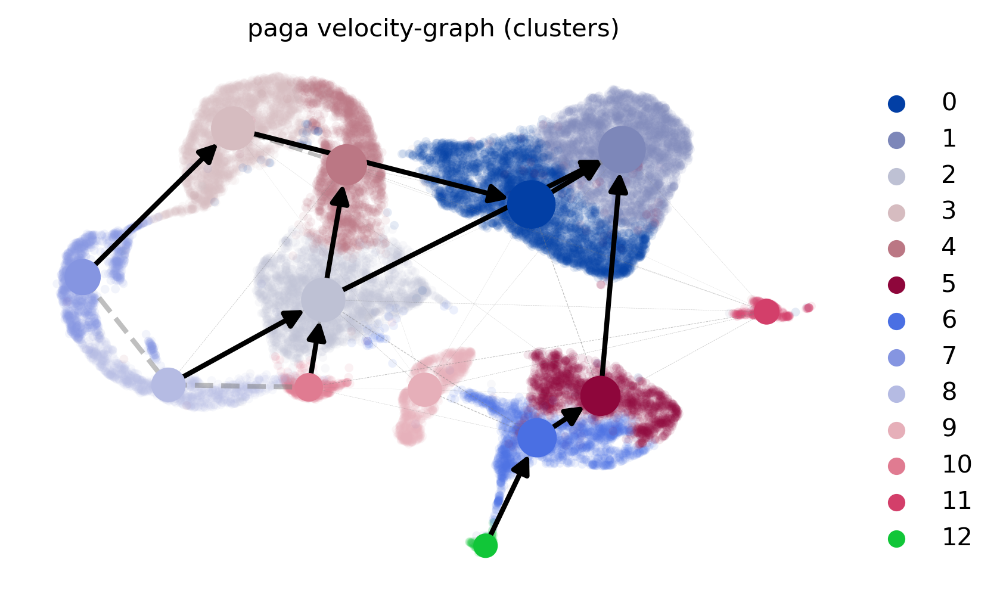

In [118]:
scv.pl.paga(BigLoom3, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5, dpi = 300, save = "PAGAVelocityGraph.png")